# Business metrics analysis
Purpose: to find out the reasons for the company's losses and propose options for solving the problems.

Despite huge investments in advertising, the company has been suffering losses for the last few months. The task is to understand the reasons and help the company to get back to profit.

There is data about users brought in from 1 May to 27 October 2019:  
- server log with data about their visits,  
- a download of their purchases during that period,  
- advertising expenses.    

To be studied:  
- where users come from and what devices they use,  
- how much it costs to bring in users from different advertising channels;  
- how much money each customer brings in,  
- when the cost of client aquisition pays off,  
- what factors prevent customer attraction.

### Data upload and its preparation for the analysis

In [2]:
# libraries import
import pandas as pd
import pandas as pd
import numpy as np
from datetime import date, datetime, timedelta
from matplotlib import pyplot as plt
import plotly
import seaborn as sns

In [60]:
# widening display and returning full TOC
from IPython.display import display, HTML
display(HTML("<style>.container { width:80%; align: left; }</style>"))
display(HTML("<style>#toc-wrapper{ position: relative; width: 20%; top: 130px; left: 0px; }</style>"))

#### Data upload:

In [3]:
visits = pd.read_csv('https://code.s3.yandex.net/datasets/visits_info_short.csv')
orders = pd.read_csv('https://code.s3.yandex.net/datasets/orders_info_short.csv')
costs = pd.read_csv('https://code.s3.yandex.net/datasets/costs_info_short.csv')

#### Data research:

In [4]:
display(visits.head())
display(orders.head())
costs.head()

,User Id,Region,Device,Channel,Session Start,Session End
0,981449118918,United States,iPhone,organic,2019-05-01 02:36:01,2019-05-01 02:45:01
1,278965908054,United States,iPhone,organic,2019-05-01 04:46:31,2019-05-01 04:47:35
2,590706206550,United States,Mac,organic,2019-05-01 14:09:25,2019-05-01 15:32:08
3,326433527971,United States,Android,TipTop,2019-05-01 00:29:59,2019-05-01 00:54:25
4,349773784594,United States,Mac,organic,2019-05-01 03:33:35,2019-05-01 03:57:40


,User Id,Event Dt,Revenue
0,188246423999,2019-05-01 23:09:52,4.99
1,174361394180,2019-05-01 12:24:04,4.99
2,529610067795,2019-05-01 11:34:04,4.99
3,319939546352,2019-05-01 15:34:40,4.99
4,366000285810,2019-05-01 13:59:51,4.99


,dt,Channel,costs
0,2019-05-01,FaceBoom,113.3
1,2019-05-02,FaceBoom,78.1
2,2019-05-03,FaceBoom,85.8
3,2019-05-04,FaceBoom,136.4
4,2019-05-05,FaceBoom,122.1


In the column names of the tables we can remove the camel case and replace spaces with underscores, otherwise, the data looks good.

#### Let's look at the data types, blanks in the columns:

In [5]:
display(visits.info())
display(orders.info())
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   User Id        309901 non-null  int64 
 1   Region         309901 non-null  object
 2   Device         309901 non-null  object
 3   Channel        309901 non-null  object
 4   Session Start  309901 non-null  object
 5   Session End    309901 non-null  object
dtypes: int64(1), object(5)
memory usage: 14.2+ MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   User Id   40212 non-null  int64  
 1   Event Dt  40212 non-null  object 
 2   Revenue   40212 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 942.6+ KB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   dt       1800 non-null   object 
 1   Channel  1800 non-null   object 
 2   costs    1800 non-null   float64
dtypes: float64(1), object(2)
memory usage: 42.3+ KB


There are no blanks, later we will process the columns with dates - we will change the format.

#### Tables `orders` and `costs` contain a column with numeric information, let's look at it in detail:

In [6]:
display(orders['Revenue'].describe().to_frame())
costs.describe()

,Revenue
count,40212.000000
mean,5.370608
std,3.454208
min,4.990000
25%,4.990000
50%,4.990000
75%,4.990000
max,49.990000


,costs
count,1800.000000
mean,58.609611
std,107.740223
min,0.800000
25%,6.495000
50%,12.285000
75%,33.600000
max,630.000000


#### Let's check the tables shapes:

In [7]:
display(visits.shape)
display(orders.shape)
costs.shape

(309901, 6)

(40212, 3)

(1800, 3)

The visits table is the most massive, 309901 rows, 6 columns. Data on orders consists of 40212 rows, on advertising prices 1800 rows.

#### Let's find out what countries, devices and advertising channels are represented in the database:

In [8]:
display(visits['Region'].unique())
display(visits['Device'].unique())
display(visits['Channel'].unique())

array(['United States', 'UK', 'France', 'Germany'], dtype=object)

array(['iPhone', 'Mac', 'Android', 'PC'], dtype=object)

array(['organic', 'TipTop', 'RocketSuperAds', 'YRabbit', 'FaceBoom',
       'MediaTornado', 'AdNonSense', 'LeapBob', 'WahooNetBanner',
       'OppleCreativeMedia', 'lambdaMediaAds'], dtype=object)

#### General conclusion:  
In the provided tables we have information about users(customers) of the company. In addition to the standard `user_id`, we have: 
- what country they are from (USA, UK, France, Germany),
- what device they use (iPhone, Mac, Android, PC),
- how they found the shop (by themselves or 10 advertising companies).   

We also have information about the orders made and the cost of advertising.

### Pre-processing

#### Let's look at the blanks in the tables:

In [9]:
display(visits.isna().sum())
display(orders.isna().sum())
costs.isna().sum()

User Id          0
Region           0
Device           0
Channel          0
Session Start    0
Session End      0
dtype: int64

User Id     0
Event Dt    0
Revenue     0
dtype: int64

dt         0
Channel    0
costs      0
dtype: int64

No blanks.

#### Let's correct the CamelCase to snake_case (removing spaces in column names):

In [10]:
visits.columns = [x.lower().replace(' ', '_') for x in visits.columns]
orders.columns = [x.lower().replace(' ', '_') for x in orders.columns]
costs.columns = [x.lower().replace(' ', '_') for x in costs.columns]

In [11]:
display(visits.head(1))
display(orders.head(1))
costs.head(1)

,user_id,region,device,channel,session_start,session_end
0,981449118918,United States,iPhone,organic,2019-05-01 02:36:01,2019-05-01 02:45:01


,user_id,event_dt,revenue
0,188246423999,2019-05-01 23:09:52,4.99


,dt,channel,costs
0,2019-05-01,FaceBoom,113.3


#### Let's check the exact duplicates in our dataframes:

In [12]:
display(visits.duplicated().sum())
display(orders.duplicated().sum())
display(costs.duplicated().sum())

0

0

0

Exact duplicates missing, near duplicates are not that interesting here.

#### Let's change the data types in our dfs:

In [13]:
visits['session_start'] = pd.to_datetime(visits['session_start'])
visits['session_end'] = pd.to_datetime(visits['session_end'])
orders['event_dt'] = pd.to_datetime(orders['event_dt'])
costs['dt'] = pd.to_datetime(costs['dt']).dt.date

#### Summary:
There are no blanks and duplicates, we corrected the font to usual and the column names (removed camel case and spaces), brought the date to the proper format.

### Set functions to calculate and analyse LTV, ROI, retention and conversion.

These are functions for calculating metrics values:

- `get_profiles()` - to create user profiles,
- `get_retention()` - to calculate Retention Rate,
- `get_conversion()` - to calculate conversion rate,
- `get_ltv()` - for calculating LTV.

As well as functions for plotting graphs:

- `filter_data()` - for smoothing data,
- `plot_retention()` - for plotting Retention Rate,
- `plot_conversion()` - to plot the Conversion Rate,
- `plot_ltv_roi` - for LTV and ROI visualisation.

#### Let's define a function to create user profiles `get_profiles()`:

In [14]:
def get_profiles(visits, orders, costs):

    # find the parameters of the first visits
    profiles = (
        visits.sort_values(by=['user_id', 'session_start'])
        .groupby('user_id')
        .agg(
            {
                'session_start': 'first',
                'channel': 'first',
                'device': 'first',
                'region': 'first',
            }
        )
        .rename(columns={'session_start': 'first_ts'})
        .reset_index()
    )

    # for the cohort analysis, determine the date of the first visit
    # and the first day of the month in which the visit occurred
    profiles['dt'] = profiles['first_ts'].dt.date
    profiles['month'] = profiles['first_ts'].dt.to_period('M')

    # add an attribute for paying users
    profiles['payer'] = profiles['user_id'].isin(orders['user_id'].unique())

    # count the number of unique users
    # with the same source and date of engagement
    new_users = (
        profiles.groupby(['dt', 'channel'])
        .agg({'user_id': 'nunique'})
        .rename(columns={'user_id': 'unique_users'})
        .reset_index()
    )

    # combine the advertising spend and the number of users attracted
    costs = costs.merge(new_users, on=['dt', 'channel'], how='left')

    # divide advertising spend by the number of users attracted
    costs['acquisition_cost'] = costs['costs'] / costs['unique_users']

    # add the cost of engagement to the profiles
    profiles = profiles.merge(
        costs[['dt', 'channel', 'acquisition_cost']],
        on=['dt', 'channel'],
        how='left',
    )

    # the cost of organic user acquisition is zero
    profiles['acquisition_cost'] = profiles['acquisition_cost'].fillna(0)

    return profiles


#### Let's define a function to calculate retention `get_retention()`:

In [15]:
def get_retention(
    profiles,
    sessions,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # add the payer column to the list being passed to dimensions
    dimensions = ['payer'] + dimensions

    # exclude users who have not "lived" to the analysis horizon
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # collect "raw" data to calculate withholding
    result_raw = result_raw.merge(
        sessions[['user_id', 'session_start']], on='user_id', how='left'
    )
    result_raw['lifetime'] = (
        result_raw['session_start'] - result_raw['first_ts']
    ).dt.days

    # function to group the table by the desired attributes
    def group_by_dimensions(df, dims, horizon_days):
        result = df.pivot_table(
            index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
        )
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # get retention table
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # get the table of retention dynamics
    result_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    # return both tables and raw data
    return result_raw, result_grouped, result_in_time 

#### Let's define a function to calculate conversion `get_conversion()`:

In [16]:
def get_conversion(
    profiles,
    purchases,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # exclude users who have not "lived" to the analysis horizon
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # determine the date and time of the first purchase for each user
    first_purchases = (
        purchases.sort_values(by=['user_id', 'event_dt'])
        .groupby('user_id')
        .agg({'event_dt': 'first'})
        .reset_index()
    )

    # add purchase data to profiles
    result_raw = result_raw.merge(
        first_purchases[['user_id', 'event_dt']], on='user_id', how='left'
    )

    # calculate the lifetime for each purchase
    result_raw['lifetime'] = (
        result_raw['event_dt'] - result_raw['first_ts']
    ).dt.days

    # group by cohort if there is nothing in dimensions
    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users' 
        dimensions = dimensions + ['cohort']

    # function to group the table by the desired attributes
    def group_by_dimensions(df, dims, horizon_days):
        result = df.pivot_table(
            index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
        )
        result = result.fillna(0).cumsum(axis = 1)
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        # divide each "cell" in the row by the cohort size
        # and get the conversion rate
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # get conversion table
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # for the conversion rate table, remove 'cohort' from dimensions
    if 'cohort' in dimensions: 
        dimensions = []

    # get the conversion rate table
    result_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    # return both tables and raw data
    return result_raw, result_grouped, result_in_time 

#### Let's define a function to calculate LTV (Lifetime Value) and ROI (Return On Investment):

In [17]:
# function for calculating LTV and ROI

def get_ltv(
    profiles,
    purchases,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # exclude users who have not "lived" to the analysis horizon
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')
    # add purchase data to profiles
    result_raw = result_raw.merge(
        purchases[['user_id', 'event_dt', 'revenue']], on='user_id', how='left'
    )
    # calculate user lifetime for each purchase
    result_raw['lifetime'] = (
        result_raw['event_dt'] - result_raw['first_ts']
    ).dt.days
    # group by cohort if there is nothing in dimensions
    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users'
        dimensions = dimensions + ['cohort']

    # function for grouping by desired attributes
    def group_by_dimensions(df, dims, horizon_days):
        # build a "triangular" revenue table
        result = df.pivot_table(
            index=dims, columns='lifetime', values='revenue', aggfunc='sum'
        )
        # find the sum of revenue with accumulation
        result = result.fillna(0).cumsum(axis=1)
        # calculate cohort sizes
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        # merge cohort sizes and revenue table
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        # calculate LTV: divide each "cell" in the row by the cohort size
        result = result.div(result['cohort_size'], axis=0)
        # exclude all lifetimes that exceed the analysis horizon
        result = result[['cohort_size'] + list(range(horizon_days))]
        # restore cohort sizes
        result['cohort_size'] = cohort_sizes

        # build a dataframe with user data and CAC values, 
        # adding parameters from dimensions
        cac = df[['user_id', 'acquisition_cost'] + dims].drop_duplicates()

        # calculate the average CAC using the parameters from dimensions
        cac = (
            cac.groupby(dims)
            .agg({'acquisition_cost': 'mean'})
            .rename(columns={'acquisition_cost': 'cac'})
        )

        # calculate ROI: divide LTV by CAC
        roi = result.div(cac['cac'], axis=0)

        # delete rows with infinite ROI
        roi = roi[~roi['cohort_size'].isin([np.inf])]

        # restore the cohort sizes in the ROI table
        roi['cohort_size'] = cohort_sizes

        # add CAC to the ROI table
        roi['cac'] = cac['cac']

        # in the final table leave cohort sizes, CAC
        # and ROI in Lifetime, not exceeding the analysis horizon.
        roi = roi[['cohort_size', 'cac'] + list(range(horizon_days))]

        # return LTV and ROI tables
        return result, roi

    # get LTV and ROI tables
    result_grouped, roi_grouped = group_by_dimensions(
        result_raw, dimensions, horizon_days
    )

    # for trend tables remove 'cohort' from dimensions
    if 'cohort' in dimensions:
        dimensions = []

    # get LTV and ROI trend tables
    result_in_time, roi_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    return (
        result_raw, # raw data
        result_grouped, # LTV table
        result_in_time, # LTV trend table
        roi_grouped, # ROI table
        roi_in_time, # ROI trend table
    ) 

#### Let's define a function for smoothing data `filter_data()`:

In [18]:
def filter_data(df, window):
    # for each column apply a moving average
    for column in df.columns.values:
        df[column] = df[column].rolling(window).mean() 
    return df 

#### We will also need a function to visualise (plot) the retention `plot_retention()`:

In [19]:
# function for visualising retention

def plot_retention(retention, retention_history, horizon, window=7):

    # set the grid size for plots
    plt.figure(figsize=(50, 30))

    # exclude cohort sizes and first day retention
    retention = retention.drop(columns=['cohort_size', 0])
    # in the dynamics table, leave only the required lifetimes.
    retention_history = retention_history.drop(columns=['cohort_size'])[
        [horizon - 1]
    ]

    # if only payer is in the retention table indexes,
    # add a second characteristic - cohort
    if retention.index.nlevels == 1:
        retention['cohort'] = 'All users'
        retention = retention.reset_index().set_index(['cohort', 'payer'])

    # in the chart table - two columns and two rows, four cells
    # in the first one, plot the retention curves of paying users
    ax1 = plt.subplot(2, 2, 1)
    retention.query('payer == True').droplevel('payer').T.plot(
        grid=True, ax=ax1
    )
    plt.legend(fontsize=15)
    plt.xlabel('Lifetime', fontsize=20)
    plt.title('Retention of paying users', fontsize=20)

    # in the second cell, plot the non-paying user retention curves.
    # the vertical axis is from the graph from the first cell
    ax2 = plt.subplot(2, 2, 2, sharey=ax1)
    retention.query('payer == False').droplevel('payer').T.plot(
        grid=True, ax=ax2
    )
    plt.legend(fontsize=15)
    plt.xlabel('Lifetime', fontsize=20)
    plt.title('Retention of non-paying users', fontsize=20)

    # in the third cell - the dynamics of retention of paying users
    ax3 = plt.subplot(2, 2, 3)
    # get column names for the summary table
    columns = [
        name
        for name in retention_history.index.names
        if name not in ['dt', 'payer']
    ]
    # filter the data and plot it
    filtered_data = retention_history.query('payer == True').pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax3)
    plt.legend(fontsize=15)
    plt.xlabel('Date of aquisition', fontsize=20)
    plt.title(
        'Dynamics of retention of paying users on {}th day'.format(horizon), fontsize=20
    )

    # in the fourth cell - the dynamics of non-paying users' retention.
    ax4 = plt.subplot(2, 2, 4, sharey=ax3)
    # filter the data and plot it
    filtered_data = retention_history.query('payer == False').pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax4)
    plt.legend(fontsize=15)
    plt.xlabel('Date of aquisition', fontsize=20)
    
    
    
    plt.title(
        'Dynamics of non-paying users retention on {}th day'.format(
            horizon
        ), fontsize=20
    )
    
    plt.tight_layout()
    plt.show()

#### Function to visualise (plot) the conversion `plot_conversion()`:

In [20]:
# function to visualise the conversion

def plot_conversion(conversion, conversion_history, horizon, window=7):

    # set the grid size for the plots
    plt.figure(figsize=(50, 15))

    # drop cohort sizes
    conversion = conversion.drop(columns=['cohort_size'])
    # in the dynamics table, leave only the required lifetimes.
    conversion_history = conversion_history.drop(columns=['cohort_size'])[
        [horizon - 1]
    ]

    # first chart - conversion curves
    ax1 = plt.subplot(1, 2, 1)
    conversion.T.plot(grid=True, ax=ax1, fontsize=20)
    plt.legend(fontsize=15)
    plt.xlabel('Lifetime', fontsize=20)
    plt.title('User Conversion', fontsize=20)

    # second chart - conversion dynamics
    ax2 = plt.subplot(1, 2, 2, sharey=ax1)
    columns = [
        # the columns of the summary table will be all the columns of the index except for the date
        name for name in conversion_history.index.names if name not in ['dt']
    ]
    filtered_data = conversion_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.legend(fontsize=15)
    plt.xlabel('Date of attraction', fontsize=20)
    plt.title('User conversion rate on {}th day'.format(horizon), fontsize=20)

    plt.tight_layout()
    plt.show() 

#### And a function to visualise LTV and ROI metrics:

In [21]:
# function to visualise LTV and ROI

def plot_ltv_roi(ltv, ltv_history, roi, roi_history, horizon, window=7):

    # set the grid for drawing the graphs
    plt.figure(figsize=(30, 15))

    # exclude cohort sizes from the ltv table
    ltv = ltv.drop(columns=['cohort_size'])
    # in the ltv dynamics table, leave only the required lifetimes.
    ltv_history = ltv_history.drop(columns=['cohort_size'])[[horizon - 1]]

    # let's put the cost of attraction into a separate frame
    cac_history = roi_history[['cac']]

    # remove cohort sizes and cac from the roi table
    roi = roi.drop(columns=['cohort_size', 'cac'])
    # in the roi dynamics table, leave only the required lifetimes.
    roi_history = roi_history.drop(columns=['cohort_size', 'cac'])[
        [horizon - 1]
    ]

    # first graph - ltv curves
    ax1 = plt.subplot(2, 3, 1)
    ltv.T.plot(grid=True, ax=ax1)
    plt.legend(fontsize=15)
    plt.xlabel('Lifetime', fontsize=20)
    plt.title('LTV', fontsize=20)

    # second chart - ltv dynamics
    ax2 = plt.subplot(2, 3, 2, sharey=ax1)
    # all columns of the index except the date will become columns of the summary table
    columns = [name for name in ltv_history.index.names if name not in ['dt']]
    filtered_data = ltv_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.legend(fontsize=15)
    plt.xlabel('Date of engagement', fontsize=20)
    plt.title('Users LTV dynamics on {}th day'.format(horizon), fontsize=20)

    # third chart - cac dynamics
    ax3 = plt.subplot(2, 3, 3, sharey=ax1)
    # the columns of the summary table will be all the columns of the index except for the date
    columns = [name for name in cac_history.index.names if name not in ['dt']]
    filtered_data = cac_history.pivot_table(
        index='dt', columns=columns, values='cac', aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax3)
    plt.legend(fontsize=15)
    plt.xlabel('Date of aquisition', fontsize=20)
    plt.title('User acquisition cost dynamics', fontsize=20)

    # fourth chart - roi curves
    ax4 = plt.subplot(2, 3, 4)
    roi.T.plot(grid=True, ax=ax4)
    plt.axhline(y=1, color='red', linestyle='--', label='Payback Rate')
    plt.legend(fontsize=15)
    plt.xlabel('Lifetime', fontsize=20)
    plt.title('ROI', fontsize=20)

    # fifth chart - roi dynamics
    ax5 = plt.subplot(2, 3, 5, sharey=ax4)
    # all the columns of the index except the date will become columns of the summary table
    columns = [name for name in roi_history.index.names if name not in ['dt']]
    filtered_data = roi_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax5)
    plt.axhline(y=1, color='red', linestyle='--', label='Payback Rate')
    plt.legend(fontsize=15)
    plt.xlabel('Date of aquisition', fontsize=20)
    plt.title('User ROI Dynamics on {}th day'.format(horizon), fontsize=20)

    plt.tight_layout()
    plt.show() 

#### General summary:
We created functions for exploratory data analysis that will help to estimate lifetime value, ROI, retention rate and conversion rate and visualise some metrics. 

### Exploratory data analysis:
- Build user profiles. Determine the minimum and maximum dates of user aquisition.
- Find out from which countries users come to the app and which country has the most paying users. Make a table showing the number of users and the share of paying users from each country.
- Find out what devices customers use and which devices are preferred by paying users. Make a table showing the number of users and the proportion of paying users for each device.
- Examine advertising sources of engagement and identify the channels from which the most paying users came. Make a table showing the number of users and proportion of paying users for each advertising channel.

#### Let's start by compiling user profiles:

In [22]:
profiles = get_profiles(visits, orders, costs)
profiles.head()

,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
0,599326,2019-05-07 20:58:57,FaceBoom,Mac,United States,2019-05-07,2019-05,True,1.088172
1,4919697,2019-07-09 12:46:07,FaceBoom,iPhone,United States,2019-07-09,2019-07,False,1.107237
2,6085896,2019-10-01 09:58:33,organic,iPhone,France,2019-10-01,2019-10,False,0.000000
3,22593348,2019-08-22 21:35:48,AdNonSense,PC,Germany,2019-08-22,2019-08,False,0.988235
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10,False,0.230769


**Summary:**  
The profile output function worked successfully, it grouped the user data sorted by user_id and session start, and applied the aggregation function first() to some columns to see the first mentioned session time, i.e. registration time.

**The minimum and maximum dates of user acquisition must be defined, and the necessary variables must be set:**

In [23]:
#set the moment of analysis
observation_date = date(2019, 11, 1)
print('Moment of analysis by condition: ' + str(observation_date))

#set analysis horizon
analysis_horizon = 14
print('Analysis horizon: ' + str(analysis_horizon) + ' days')

#minimum date of customer acquisition
min_analysis_date = costs['dt'].min()

#maximum date of customer acquisition taking into account the horizon
max_analysis_date = observation_date - timedelta(days= analysis_horizon - 1) 

print('Minimum date of customer acquisition: ' + str(min_analysis_date))
print('Maximum date of customer acquisition including horizon: ' + str(max_analysis_date))


Moment of analysis by condition: 2019-11-01
Analysis horizon: 14 days
Minimum date of customer acquisition: 2019-05-01
Maximum date of customer acquisition including horizon: 2019-10-19


####  Let's find out from which countries users come to the app and which country has the most paying users and make a table:

In [24]:
def check_data(index):
    info = (
    profiles.groupby(index)
    .agg({'user_id' : 'nunique', 'payer' : 'sum'})
    .sort_values(by='payer', ascending=False)
)
    info['share'] = info['payer'] / info['user_id']
    return info

In [25]:
check_data('region')

,user_id,payer,share
region,,,
United States,100002,6902,0.069019
UK,17575,700,0.039829
France,17450,663,0.037994
Germany,14981,616,0.041119


In [26]:
region = (
    profiles.groupby('region')
    .agg({'user_id' : 'nunique', 'payer' : 'sum'})
    .sort_values(by='payer', ascending=False)
)
region['share'] = region['payer'] / region['user_id']
region

,user_id,payer,share
region,,,
United States,100002,6902,0.069019
UK,17575,700,0.039829
France,17450,663,0.037994
Germany,14981,616,0.041119


**Summary:**
Thanks to grouping, aggregation functions and sorting, we can see which customers come to the site from which countries, as well as which country is leading in terms of paying users.

And even if we sum up all users (including paying users) of other countries, we will barely get half of all users of the US, and the share of buyers from USA is the highest by a margin.

#### Let's find out which devices are used by customers and which devices are preferred by paying users, for this purpose we will build a table

In [27]:
device = (
    profiles.groupby('device')
    .agg({'user_id' : 'nunique', 'payer': 'sum'})
    #.rename(columns={'user_id': 'total_users', 'share' : 'payers_share'})
    .sort_values(by='user_id', ascending=False)
)
device['share'] = device['payer'] / device['user_id']
device.drop(columns='payer')

,user_id,share
device,,
iPhone,54479,0.062079
Android,35032,0.058518
PC,30455,0.050468
Mac,30042,0.063644


**Summary:**  
Conclusion:
We can see that the leading device is iPhone, but the share of paying customers is higher on Mac.

Mac leads in terms of share, while Iphone leads in absolutes. Here we can see that Apple devices are leading in the aggregate with a gap.

#### Let's identify the channels from which the most paying users came:

In [28]:
channel = (
    profiles.groupby('channel')
    .agg({'user_id' : 'nunique', 'payer' : 'sum'})
    .sort_values(by='user_id', ascending=False)
)
print('Sources quantity: ' + str(len(channel)))
channel['share'] = channel['payer'] / channel['user_id']
channel
#channel.drop(columns='payer')

Sources quantity: 11


,user_id,payer,share
channel,,,
organic,56439,1160,0.020553
FaceBoom,29144,3557,0.122049
TipTop,19561,1878,0.096007
OppleCreativeMedia,8605,233,0.027077
LeapBob,8553,262,0.030633
WahooNetBanner,8553,453,0.052964
RocketSuperAds,4448,352,0.079137
MediaTornado,4364,156,0.035747
YRabbit,4312,165,0.038265


**Summary:**  
Our company attracts users through 10 advertising sources, the 11th source is organic, when users come by themselves, such users are the most numerous.  
Of the paid advertising channels, FaceBoom attracted the most users and the most paying customers, its share of paying customers out of the total number of attracted customers is the leader among all advertising channels.

#### General summary:  
Having studied the available data, we know that the company's services are used in 4 countries: USA, Germany, UK and France. The most customers are from the US, just over 100k, and the share of paying users is the same there, almost 7%. The least number of users is from Germany, less than 15 thousand, and the smallest share of paying users is in France, less than 4%.   
Among devices iPhone, Android, Mac and PC are represented. The iPhone leads with almost 54.5 thousand users, but the share of paying customers is slightly higher on Mac, over 6%. Makes sense, not everyone can afford a Mac : )  
The most profitable paid advertising channel is FaceBoom, leading both in terms of the number of attracted customers and the share of paying users. However, it's worth noting that in general the most customers came on their own, but of those, the least number of paying users as well.

### Marketing

- Calculate the total amount spent on marketing.
- Find out how the spending is distributed by advertising sources, i.e. how much money was spent on each source.
- Build a visualisation of the dynamics of spending over time (by week and month) for each source.
- Let's find out how much it cost on average to attract one user (CAC) from each source.

#### Let's calculate the total amount spent on advertising:

In [29]:
total_costs = round(costs['costs'].sum())
print('Total costs for advertising: ' + str(total_costs) + ' moneys' )

Total costs for advertising: 105497 moneys


#### Let's look at the distribution of spending by advertising source:

In [30]:
costs_by_channel = costs.groupby('channel').agg({'costs' : 'sum'}).sort_values(by='costs', ascending=False)
costs_by_channel['share, %'] = round((costs_by_channel['costs'] / total_costs) * 100, 1)
costs_by_channel

,costs,"share, %"
channel,,
TipTop,54751.30,51.9
FaceBoom,32445.60,30.8
WahooNetBanner,5151.00,4.9
AdNonSense,3911.25,3.7
OppleCreativeMedia,2151.25,2.0
RocketSuperAds,1833.00,1.7
LeapBob,1797.60,1.7
lambdaMediaAds,1557.60,1.5
MediaTornado,954.48,0.9


**Summary:**  
TipTop adverts were the most expensive, followed by FaceBoom, while the rest of the ad campaigns cost significantly less.

#### Let's visualise the dynamics of changes in expenses by time (weeks and months):

To do this, let's extract the week and month number from the column with date:

In [31]:
costs['dt'] = pd.to_datetime(costs['dt'])
costs['week_number'] = costs['dt'].dt.isocalendar().week
costs['month_number'] = costs['dt'].dt.month
costs.head()

,dt,channel,costs,week_number,month_number
0,2019-05-01,FaceBoom,113.3,18,5
1,2019-05-02,FaceBoom,78.1,18,5
2,2019-05-03,FaceBoom,85.8,18,5
3,2019-05-04,FaceBoom,136.4,18,5
4,2019-05-05,FaceBoom,122.1,18,5


Let's group the data by new columns:

In [32]:
costs.groupby(['week_number', 'month_number']).agg({'costs' : 'sum'})
costs

,dt,channel,costs,week_number,month_number
0,2019-05-01,FaceBoom,113.3,18,5
1,2019-05-02,FaceBoom,78.1,18,5
2,2019-05-03,FaceBoom,85.8,18,5
3,2019-05-04,FaceBoom,136.4,18,5
4,2019-05-05,FaceBoom,122.1,18,5
...,...,...,...,...,...
1795,2019-10-23,lambdaMediaAds,4.0,43,10
1796,2019-10-24,lambdaMediaAds,6.4,43,10
1797,2019-10-25,lambdaMediaAds,8.8,43,10
1798,2019-10-26,lambdaMediaAds,8.8,43,10


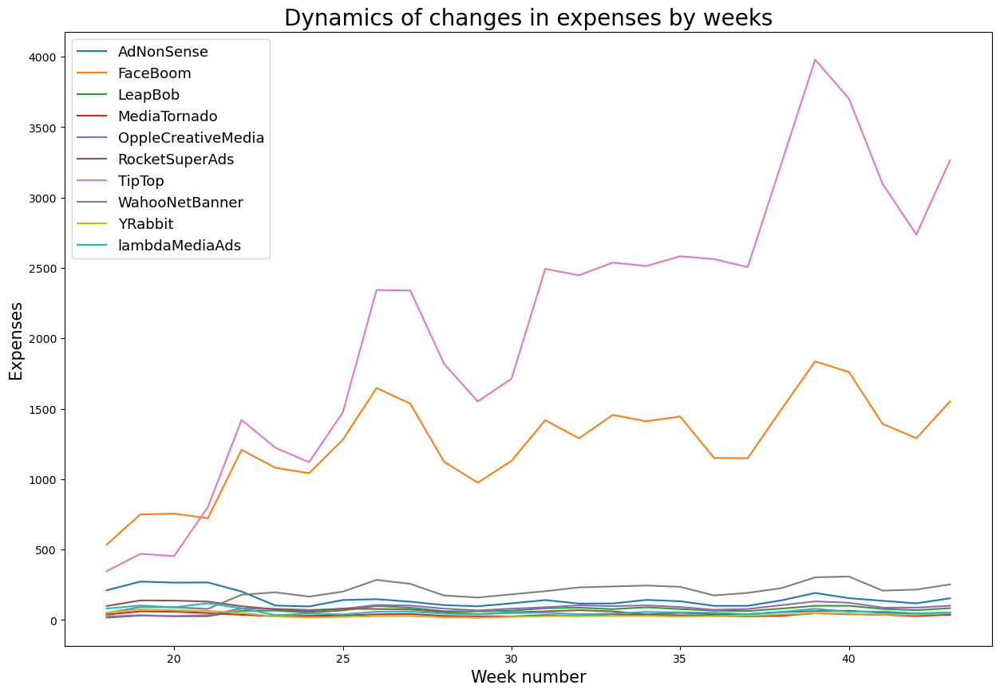

In [33]:
costs.pivot_table(
    index=['week_number'], columns='channel', values='costs', aggfunc='sum'
).plot(figsize=(15, 10))
plt.title('Dynamics of changes in expenses by weeks', fontsize=20)
plt.xlabel('Week number', fontsize=15)
plt.ylabel('Expenses', fontsize=15)
plt.legend(fontsize=13)

plt.show()


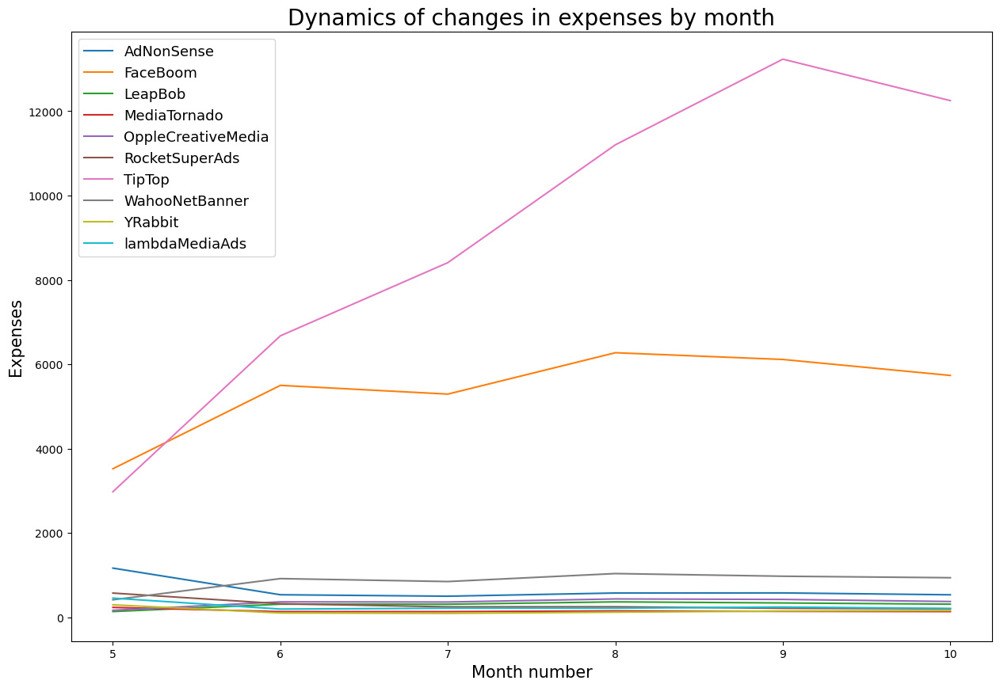

In [34]:
costs.pivot_table(
    index=['month_number'], columns='channel', values='costs', aggfunc='sum'
).plot(figsize=(15, 10))
plt.title('Dynamics of changes in expenses by month', fontsize=20)
plt.xlabel('Month number', fontsize=15)
plt.ylabel('Expenses', fontsize=15)
plt.legend(fontsize=13)

plt.show()

Let's also analyse the same information without the data of the top channels in order to better see the specifics, as the data for the other channels have blended together and are hard to recognise:

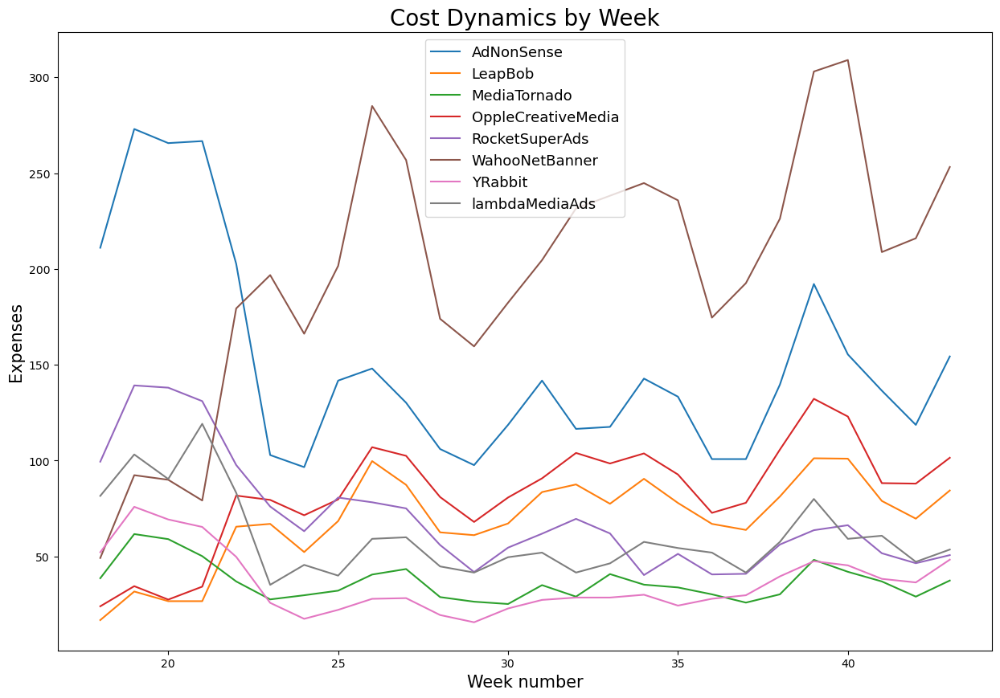

In [35]:
# remove leaders from the graph:
costs_2 = costs[(costs['channel'] != 'FaceBoom') & (costs['channel'] != 'TipTop')]

costs_2.pivot_table(
    index=['week_number'], columns='channel', values='costs', aggfunc='sum'
).plot(figsize=(15, 10))
plt.title('Cost Dynamics by Week', fontsize=20)
plt.xlabel('Week number', fontsize=15)
plt.ylabel('Expenses', fontsize=15)
plt.legend(fontsize=13)

plt.show()

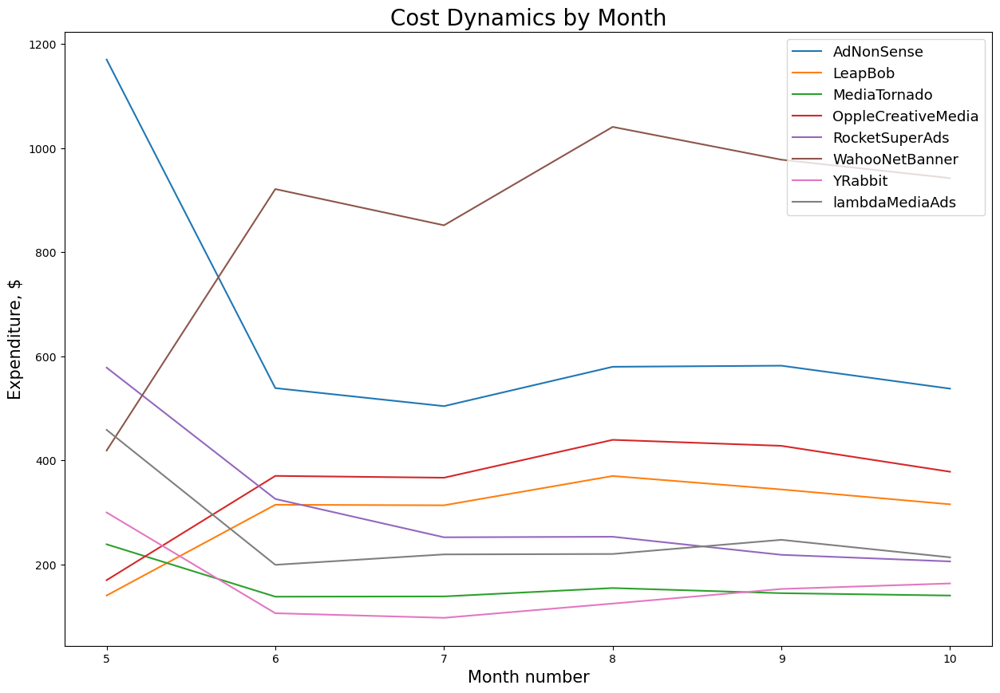

In [36]:
costs_2.pivot_table(
    index=['month_number'], columns='channel', values='costs', aggfunc='sum'
).plot(figsize=(15, 10))
plt.title('Cost Dynamics by Month', fontsize=20)
plt.xlabel('Month number', fontsize=15)
plt.ylabel('Expenditure, $', fontsize=15)
plt.legend(fontsize=13)

plt.show()

Indeed, the costs fluctuate in a small interval, periodically changing places. We can single out WahooNetBanner and AdNonSense among these outsiders. They can be studied in detail.

**Summary:**  
On both charts, the leaders in terms of advertising costs definitely stand out, with TipTop taking the lead after some time in the research period. The dynamics of the other 8 advertising companies is rather monotonous and does not exceed 1500 moneys per month.
The graph of changes by months is smoother, as there are fewer reference points in it.

#### Let's calculate the customer aquisition cost (CAC):

In [37]:
# first calculate LTV by customer acquisition channel:
dimensions = ['channel']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, analysis_horizon, dimensions=dimensions
)

In [38]:
# find the maximum date of the attraction from the raw LTV data:
max_acquitision_dt = ltv_raw['dt'].max()

# cut off profiles that are "older" than this date
ltv_profiles = profiles.query('dt <= @max_acquitision_dt')

# the remaining number of users per lifetime
ltv_profiles.groupby('dt').agg({'user_id': 'nunique'})

,user_id
dt,
2019-05-01,909
2019-05-02,758
2019-05-03,849
2019-05-04,1015
2019-05-05,970
...,...
2019-10-15,674
2019-10-16,656
2019-10-17,703


In [39]:
# calculate average CAC by channel of attraction
cac = (
    ltv_profiles.groupby('channel')
    .agg({'acquisition_cost': 'mean'})
    .rename(columns={'acquisition_cost': 'cac'})
    .sort_values(by='cac', ascending=False)
)

cac

,cac
channel,
TipTop,2.757774
FaceBoom,1.113419
AdNonSense,1.008023
lambdaMediaAds,0.727237
WahooNetBanner,0.601856
RocketSuperAds,0.417431
OppleCreativeMedia,0.249908
MediaTornado,0.219035
YRabbit,0.217087


**Summary:**  
We get a table of the cost of attracting one client by source. The first two leaders were more expensive than the rest. Everything looks logical, organic users come for free.

#### General summary:
The total amount of advertising costs in the specified time interval was 105497 moneys. TipTop (54751 moneys), followed by FaceBoom (32446 moneys) was the most expensive source. The rest of the ad channels cost 5000 or less.
CAC approximately repeats the level of advertising spending in the sources, with the same companies leading the way in terms of advertising spend: the cost of attracting one user through the TipTop channel is 2.8 moneys, FaceBoom - 1.1. Other channels cost 1 money and less.

### Evaluate the advertising payback

Using the LTV, ROI and CAC charts, let's analyse the company's advertising ROI. It's 1 November 2019 on the calendar, and the business plan states that users should pay off no later than two weeks after attraction. Let's determine if organic users should be included in the analysis.  

**We will:**
-  analyse the return on advertising with the help of LTV and ROI charts, as well as charts of LTV, CAC and ROI dynamics.
- check user conversion and its dynamics. Do the same with user retention. Build and study conversion and retention graphs.
- analyse advertising ROI by device. Build LTV and ROI graphs, as well as graphs of LTV, CAC and ROI trends.
- analyse advertising ROI by country. Construct LTV and ROI graphs as well as LTV, CAC and ROI trend graphs.
- analyse advertising ROI by advertising channel. Construct LTV and ROI graphs as well as graphs of LTV, CAC and ROI trends.  

The company has requested answers to the following questions:
- Does advertising aimed at attracting users in general pay off?
- Which devices, countries and advertising channels can have a negative impact on advertising ROI?
- What might cause payback problems?

In [40]:
# we'll exclude users who came on their own because it's free
profiles = profiles.query('channel != "organic"')

#### Let's see the return on advertising using LTV and ROI functions, as well as graphs of LTV, CAC and ROI dynamics used earlier:

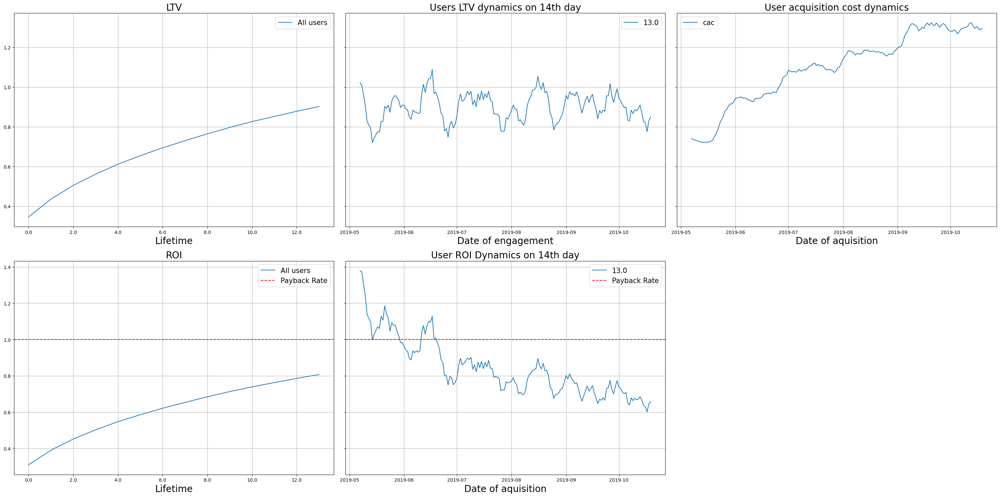

In [41]:
# calculate LTV, CAC and ROI
ltv_raw, ltv, ltv_history, roi, roi_history = get_ltv(
    profiles,
    orders,
    observation_date,
    analysis_horizon,
)

# plot
plot_ltv_roi(ltv, ltv_history, roi, roi_history, analysis_horizon) 

**Summary:**  
The graphs clearly show that ROI is below the payback level. In June, the cost of attracting users jumped noticeably and continued to grow almost until the end of the study period. We can also see that on the 14th day the ROI is decreasing.

So CAС is growing, LTV though conditionally stable, but it is not enough for positive ROI of the campaign, ROI dynamics has been deteriorating since June

#### Let's evaluate the dynamics and look at the conversion and retention graphs:

Let's call the customer conversion calculation function and plot the graphs:

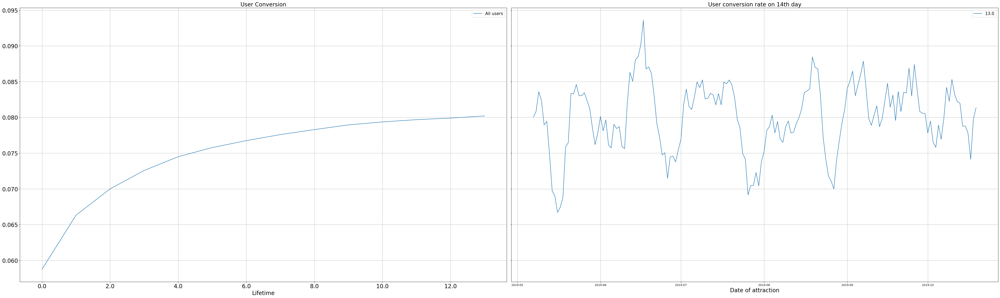

In [42]:
conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, analysis_horizon
)

plot_conversion(conversion_grouped, conversion_history, analysis_horizon) 

Let's call the function for calculating the retention and plot the graphs:

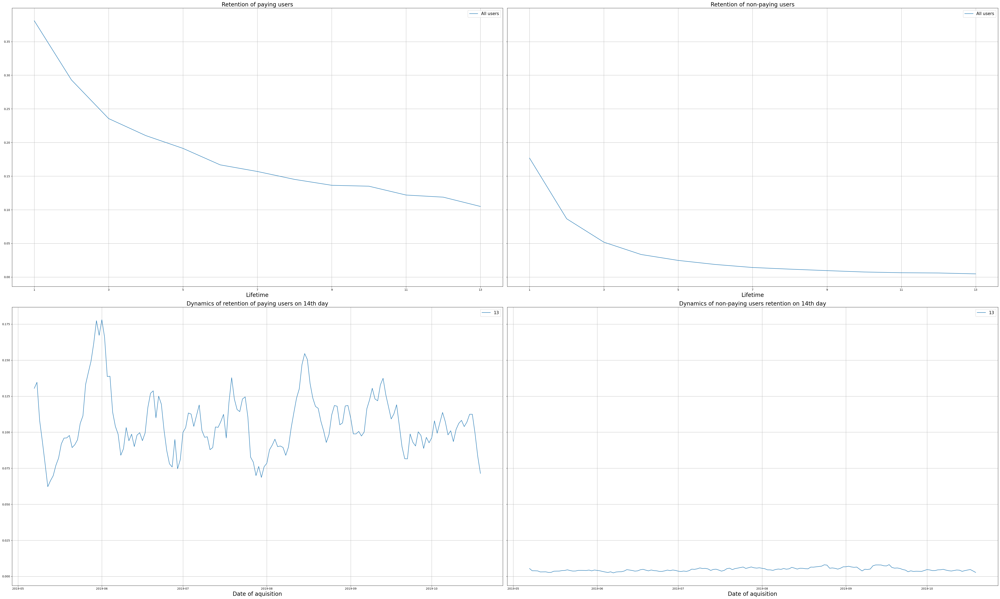

In [43]:
retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, analysis_horizon)

plot_retention(retention_grouped, retention_history, analysis_horizon) 


**Summary:** 
Looking at the conversion charts, we can come to the conclusion that there is a conversion. And the more Lifetime, the higher the conversion rate, i.e. the advertising campaign and mailings are working quite well. Looking at the dynamics of conversion on the 14th day, we can see fluctuations in values. In May there was a very low indicator, in June it was very high, then gradually the graph is flattening out, possibly indicating changes (and in the end positive changes are more visible) in the advertising strategy of the company. Conversion rates can also be affected by external factors, such as the seasonality.
Talking about user retention, there is a noticeable difference between paying and non-paying users: retention of the first ones is much better. It is necessary to study the differences in the approach to paying and non-paying users and draw conclusions about the strategy.
Let's also look at the conversion and retention by individual segments (countries, devices, channels)

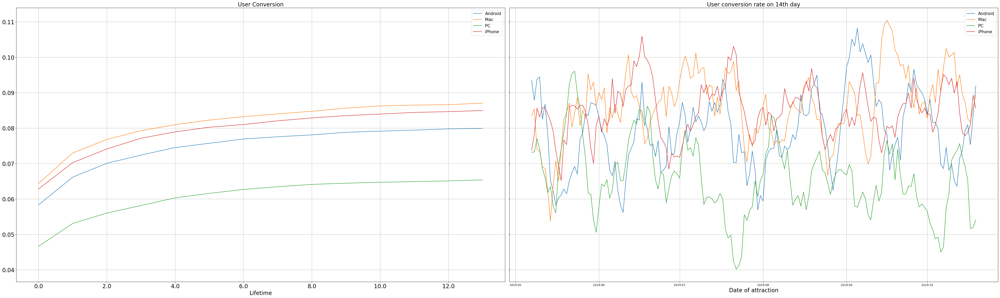

In [44]:
dimensions = ['device']

conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, analysis_horizon) 


#### Let's analyse the advertising ROI per device:

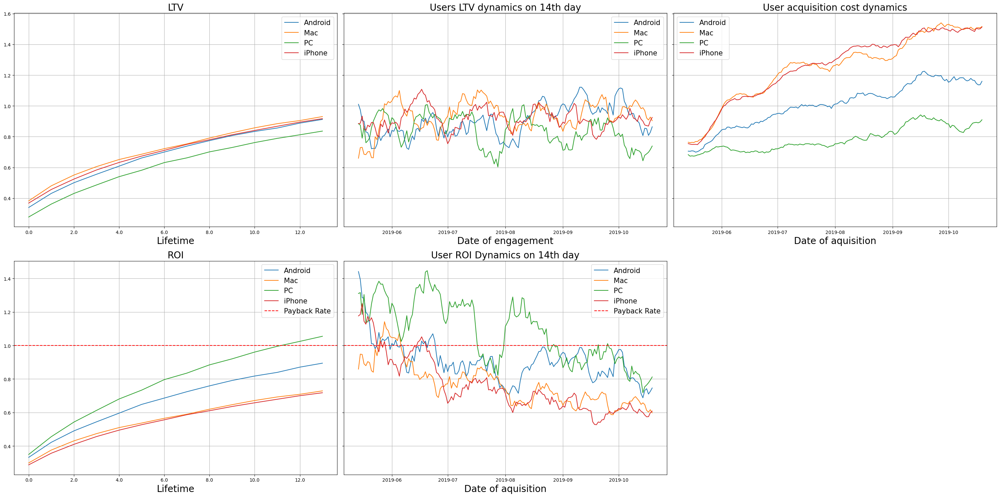

In [45]:
# looking at the payback by device and moving averages

dimensions = ['device']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 

**Summary:**  
The ROI graph indicates that PC users are paying off unlike users of all other devices. Much closer to the ROI threshold is the Android mobile platform. Mac and iPhone are somewhere very low, however close.  
The cost dynamics suggest that spending has been rising over time, with PC users being the cheapest, then Android and again Mac and iPhone somewhere together and high in spending.  
At the same time, the ROI dynamics on day 14 for all devices was downward trending over the time studied.

Thus, only PC can be called successful in terms of ROI, but this device is the cheapest, with the most expensive Apple devices having the worst ROI, but the ROI dynamics look bad everywhere in general

#### Let's analyse the return on advertising by country:

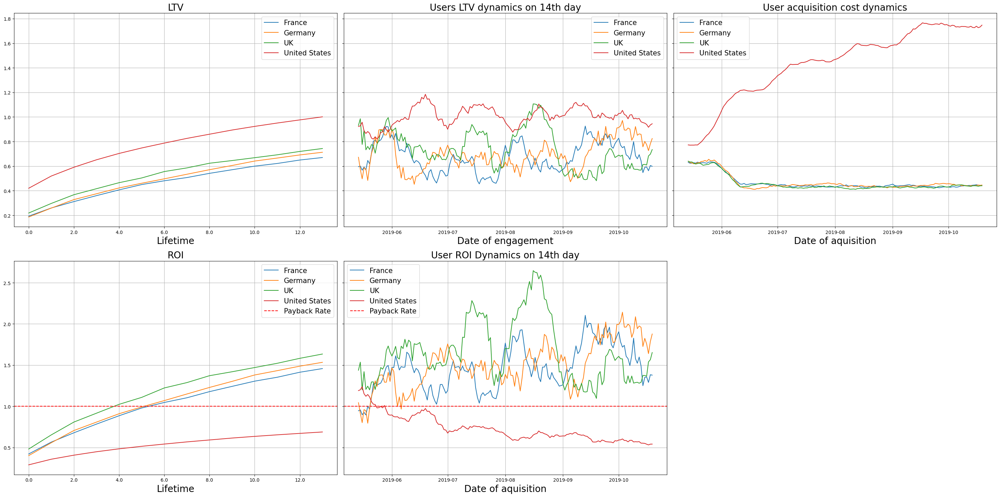

In [46]:
# looking at ROI by country and moving averages

dimensions = ['region']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 

**Summary:**
We see an outsider in terms of payback - the USA, the only country that has not crossed the payback ceiling. At the same time, it is the only country where the value dynamics is upward and strong, and the lifetime value is also high. Users from the rest of the countries cross the ROI threshold on day 3-4. The ROI dynamics on day 14 decreased strongly towards the end of the study period.


High LTV, high CAS, low ROI in the USA, while other countries pay off quite well. As mentioned above on the device project, it would also be interesting to know what is the breakdown in country-device-channel bindings, i.e. to define the US problem more specifically it would be useful for us to know.

#### Let's look at advertising ROI per ad channel:

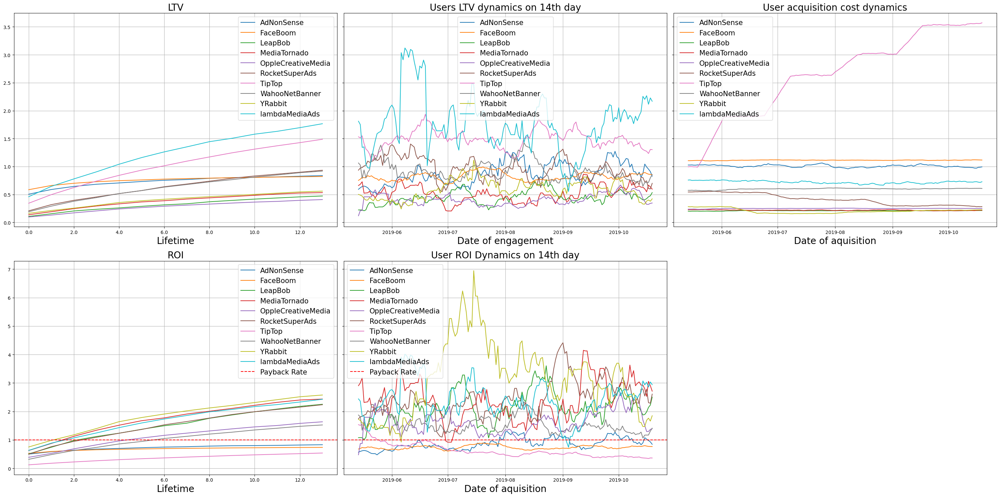

In [47]:
# looking at ROI by channel and moving average

dimensions = ['channel']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 

**Summary:**
The ROI for almost all ad channels justified, with the exception of TipTop, FaceBoom and AdNonSense.
We have already mentioned TipTop and Faceboom as the most expensive in terms of CAC and total ad spend. Even though they attracted the most users, including paying users, spending on these ad channels is worth reconsidering.

It's also important to take a closer look at those channels that were able to achieve good performance.

Let's exclude expensive channels from the data to better evaluate performance:

In [48]:
bad_channels = ['TipTop', 'FaceBoom', 'AdNonSense']

good_channel_profiles = profiles[~profiles.channel.isin(bad_channels)]

Let's take a look at the metrics without the bad channels:

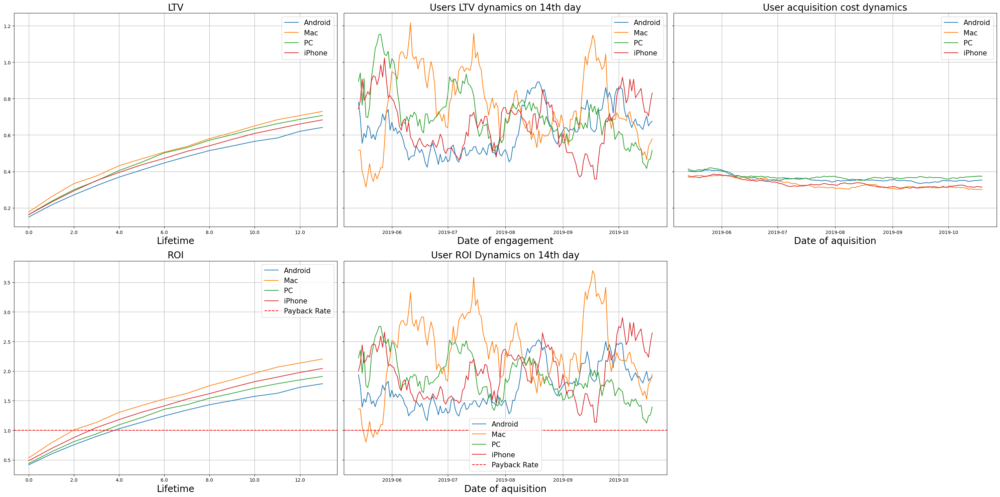

In [49]:
# looking at ROI by device and moving average without bad channels

dimensions = ['device']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    good_channel_profiles, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 

All devices pay off adverts on all devices with no bad channels, so the problem is not technical.

The devices themselves do not affect the payback rate

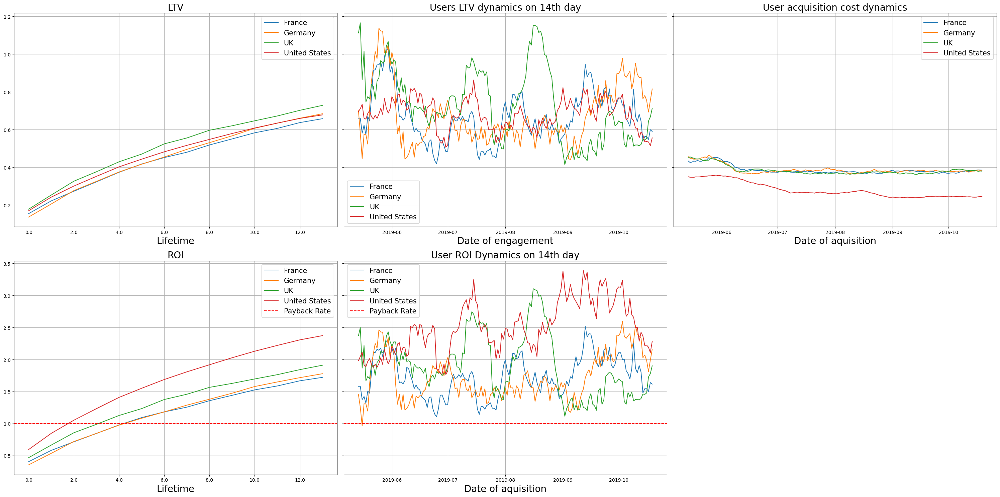

In [50]:
# looking at ROI by country and moving average with no bad channels

dimensions = ['region']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    good_channel_profiles, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 

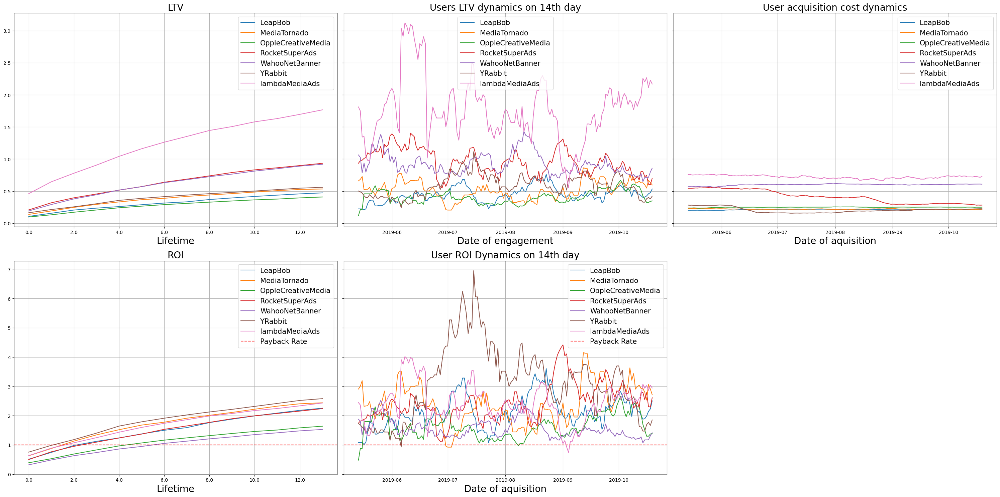

In [51]:
# looking at payback by channel and moving average without bad channels

dimensions = ['channel']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    good_channel_profiles, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 


All the remaining channels behave pretty evenly, the standouts are lambdaMediaAds for LTV and YRabbit for ROI on day 14.

There are quite a lot of paid off channels in the campaign

Let's examine the situation in the United States:

In [52]:
# removing all countries except the US from the table
profiles_usa = profiles.query('region == "United States"')

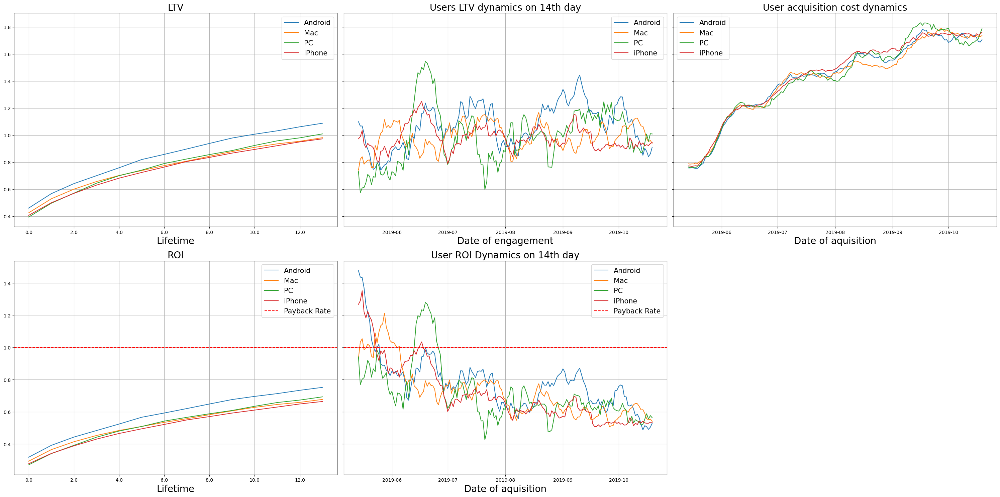

In [53]:
# look at payback by device and moving averages in the US

dimensions = ['device']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles_usa, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 

Seeing the ROI problem on all devices in the US. Increasing cost and decreasing ROI on day 14.

ROI in US devices is totally negative

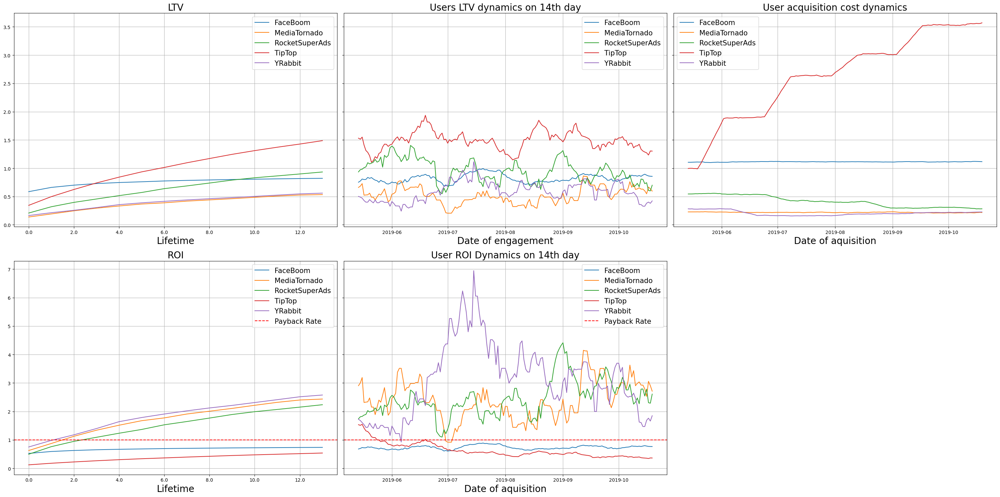

In [54]:
# looking at ROI by channel and moving averages in the US

dimensions = ['channel']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles_usa, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 

We see our outsiders more clearly: FaceBoom and TipTop clearly require action.
At the same time, two attraction channels have the most significant impact in the US.

Let's look at the European countries:

In [55]:
# excluding the USA from the table
profiles_eu = profiles.query('region != "United States"')

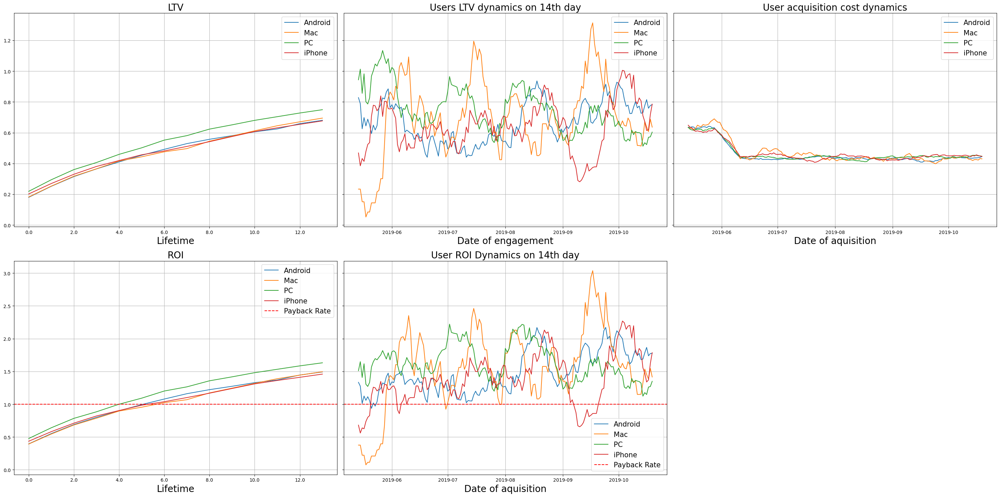

In [56]:
# looking at return on investment by device and moving averages in Europe

dimensions = ['device']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles_eu, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 

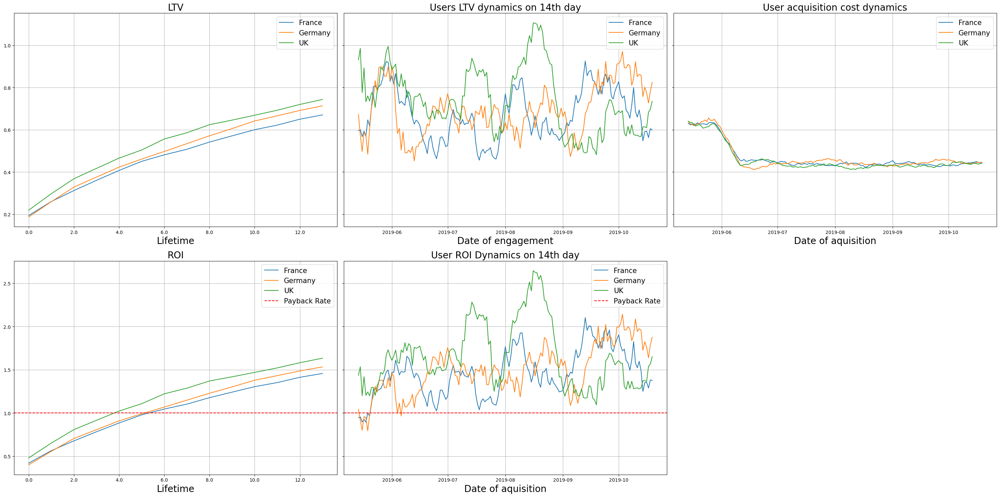

In [57]:
# looking at payback by country and moving averages in Europe

dimensions = ['region']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles_eu, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 

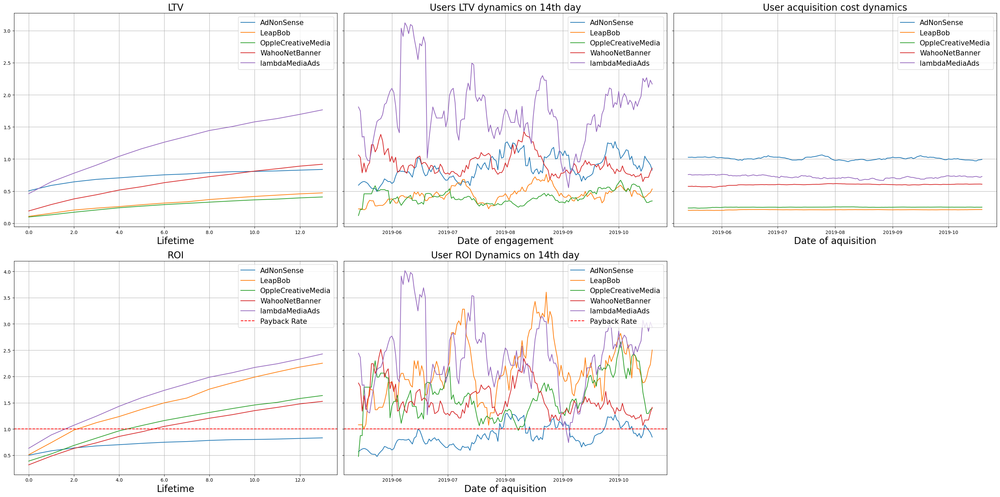

In [58]:
# looking at payback by channel and moving averages in Europe

dimensions = ['channel']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles_eu, orders, observation_date, analysis_horizon, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, analysis_horizon, window=14
) 

**Summary:**  
The ROI of almost all advertising channels was worth it, except for TipTop, FaceBoom and AdNonSense.
We have already mentioned TipTop and Faceboom as the most expensive in terms of CAC and total ad spend. Even though they attracted the most users, including paying users, spending on these ad channels is worth reconsidering.

The European ad channel LeapBob with the highest ROI and low cost of engagement is worth mentioning. RocketSuperAds with an average ROI and a lower cost of engagement by the end of the study period.

Now we know the relationship between channels and countries, as well as what the problems of attraction devices were.

#### General summary:  
The company's data on users, purchases and ad spend from 1 May 2019 to 27 October 2019 was used for the study. The data is pretty clean, with no duplicates or blanks, which indicates a good registration system on the site.

Analysing the data revealed that the site is used in 4 countries: the US, UK, Germany and France. The largest number of users is in the USA.

Accounts are registered from 4 devices: Iphone, Android, Mac and PC. Most registrations are from iPhone. Mac and iPhone sales are second to other devices.

Analysing the business metrics led to the understanding that spending on advertising is being done unnecessarily. We see that ad spend in the US is high and not paying off despite having the largest number of users. A detailed dive into the company's performance in the US reveals that no device is paying off there. Clearly see the poor performance of TipTop and FaceBoom ad channels in the US. YRabbit, MediaTornado and RocketSuperAds channels are performing well in the US, it is better to invest money in advertising through these channels.
Also pay attention to the UK channel AdNonSense with very poor performance and think about its necessity. The European channel LeapBob shows itself very well: low cost of attracting customers and high ROI - more investments can be directed there.

In terms of devices, advertising doesn't pay off on most platforms except PC. If we look separately, it turns out that in the US advertising does not pay off on any device, but in Europe it pays off on all of them.

In the context of advertising channels, we see that 7 out of 10 channels have passed the payback threshold, with 2 out of 3 not paying off being the most costly, and dramatically so. The marketing department needs to reconsider the need to expand the product in the US because of the huge expenditures on advertising. It is necessary to calculate the reasonableness of spending on certain channels of advertising, because not always a large expenditure on advertising equals great success. Explore cultural sensitivities that may make a presence in the U.S. market unnecessary.

To improve conversion rates, it is always important to follow all steps of the customer: whether the website is user-friendly, whether the registration form is convenient, whether there is enough information on the product, whether the order is processed in a timely manner, and so on.
To work on customer retention you should pay attention to: product and service quality, support and feedback, loyalty programmes, bonuses after purchase, exclusive offers for customers, SMM. It is well known that the probability of selling a product to a new customer is on average 20-50%, and 60-70% to an old one.